In [ ]:
#i used this website : https://towardsdatascience.com/variational-autoencoder-demystified-with-pytorch-implementation-3a06bee395ed


In [ ]:
import matplotlib.pyplot as plt 
import numpy as np 
import pandas as pd 
import random 
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader,random_split
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
from sklearn.model_selection import train_test_split

In [ ]:
data_dir = 'data'

train_dataset = torchvision.datasets.MNIST('data', train=True, download=True, transform=transforms.ToTensor())
test_dataset  = torchvision.datasets.MNIST('data', train=False, download=True, transform=transforms.ToTensor())


In [ ]:
train_dataset, val_dataset = train_test_split(train_dataset, test_size=0.2, random_state=42)

In [ ]:
from torch.utils.data import Dataset, DataLoader
import random
class newdataset(Dataset):
    def __init__(self, dataset):
        self.dataset = dataset

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, index):
        image, label = self.dataset[index]
        noise_factor = .3
        noisy = image + torch.randn_like(image) * noise_factor
        noisy = torch.clip(noisy,0.,1.)
        return noisy, image, label
        

In [ ]:
train_dataset_noisy = newdataset(train_dataset)
val_dataset_noisy = newdataset(val_dataset)
test_dataset_noisy = newdataset(test_dataset)

train_loader = DataLoader(train_dataset_noisy, batch_size=32, shuffle=True)
valid_loader = DataLoader(val_dataset_noisy, batch_size=32)
test_loader = DataLoader(test_dataset_noisy, batch_size=32)

In [ ]:
lengh = len(train_dataset)

train_data, val_data = random_split(train_dataset, [int(lengh - lengh * 0.2), int(lengh * 0.2)])
batch_size = 256

train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size)
valid_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,shuffle=True)

In [ ]:
def add_noise(inputs,noise_factor=0.3):
     noisy = inputs+torch.randn_like(inputs) * noise_factor
     noisy = torch.clip(noisy,0.,1.)
     return noisy

In [ ]:
class Encoder(nn.Module):
    
    def __init__(self, encoded_space_dim,fc2_input_dim):
        super().__init__()
        
        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(1, 8, 3, stride=2, padding=1),
            nn.ReLU(True),
            nn.Conv2d(8, 16, 3, stride=2, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.Conv2d(16, 32, 3, stride=2, padding=0),
            nn.ReLU(True)
        )
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)
        self.encoder_lin = nn.Sequential(
            nn.Linear(3 * 3 * 32, 128),
            nn.ReLU(True),
            nn.Linear(128, encoded_space_dim)
        )
        
    def forward(self, x):
        x = self.encoder_cnn(x)
        x = self.flatten(x)
        x = self.encoder_lin(x)
        return x


In [ ]:
class Decoder(nn.Module):
    
    def __init__(self, encoded_space_dim,fc2_input_dim):
        super().__init__()
        self.decoder_lin = nn.Sequential(
            nn.Linear(encoded_space_dim, 128),
            nn.ReLU(True),
            nn.Linear(128, 3 * 3 * 32),
            nn.ReLU(True)
        )

        self.unflatten = nn.Unflatten(dim=1, 
        unflattened_size=(32, 3, 3))

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(32, 16, 3, 
            stride=2, output_padding=0),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 8, 3, stride=2, 
            padding=1, output_padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 1, 3, stride=2, 
            padding=1, output_padding=1)
        )
        
    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

In [ ]:
class AE(nn.Module):
    def __init__(self, encoded_space_dim):
        super().__init__()
        #encoder

       ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(1, 8, 3, stride=2, padding=1),
            nn.ReLU(True),
            nn.Conv2d(8, 16, 3, stride=2, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.Conv2d(16, 32, 3, stride=2, padding=0),
            nn.ReLU(True)
        )
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)
        ### Linear section
        self.encoder_lin = nn.Sequential(
            nn.Linear(3 * 3 * 32, 128),
            nn.ReLU(True),
            nn.Linear(128, encoded_space_dim)
        )


        #decoder

        self.decoder_lin = nn.Sequential(
            nn.Linear(encoded_space_dim, 128),
            nn.ReLU(True),
            nn.Linear(128, 3 * 3 * 32),
            nn.ReLU(True)
        )

        self.unflatten = nn.Unflatten(dim=1, 
        unflattened_size=(32, 3, 3))

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(32, 16, 3, 
            stride=2, output_padding=0),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 8, 3, stride=2, 
            padding=1, output_padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 1, 3, stride=2, 
            padding=1, output_padding=1)
        )

    def encoder(self, x):
      x = self.encoder_cnn(x)
      x = self.flatten(x)
      x = self.encoder_lin(x)
      return x

    def decoder(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x
        

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [ ]:

### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr = 0.001

### Set the random seed for reproducible results
torch.manual_seed(0)


model = AE(encoded_space_dim = 4)
optim = torch.optim.Adam(model.parameters(), lr = lr, weight_decay = 1e-05)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')


model.to(device)

Selected device: cuda


AE(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): ReLU(inplace=True)
    (5): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (6): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=128, out_features=4, bias=True)
  )
  (decoder_lin): Sequential(
    (0): Linear(in_features=4, out_features=128, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=128, out_features=288, bias=True)
    (3): ReLU(inplace=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), 

In [ ]:
### Training function
def train_in_epoch(model, device, dataloader, loss_fn, optimizer, noise_factor = 0.3):
    # Set train mode for both the encoder and the decoder
   
    model.train()
    train_loss = []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for noisy, image, label in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image.to(device)
        noisy_image = noisy.to(device)    
        
        decoded_data = model(noisy_image)#decoder(encoded_data)
        # Evaluate loss
        loss = loss_fn(decoded_data, image_batch)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        print('\t partial train loss (single batch): %f' % (loss.data))
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)

In [ ]:

### Testing function
def test_in_epoch(model, device, dataloader, loss_fn,noise_factor=0.3):
    # Set evaluation mode for encoder and decoder
    #encoder.eval()
    #decoder.eval()
    model.train()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for noisy, image, label in dataloader:
            # Move tensor to the proper device
            noisy_image = noisy.to(device)
           
            decoded_data = model(noisy_image)#decoder(encoded_data)
            # Append the network output and the original image to the lists
            conc_out.append(decoded_data.cpu())
            conc_label.append(image.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

EPOCH 1/30
	 partial train loss (single batch): 0.254461
	 partial train loss (single batch): 0.246750
	 partial train loss (single batch): 0.242325
	 partial train loss (single batch): 0.236224
	 partial train loss (single batch): 0.232425
	 partial train loss (single batch): 0.230167
	 partial train loss (single batch): 0.224878
	 partial train loss (single batch): 0.223963
	 partial train loss (single batch): 0.220748
	 partial train loss (single batch): 0.218589
	 partial train loss (single batch): 0.216093
	 partial train loss (single batch): 0.214657
	 partial train loss (single batch): 0.212279
	 partial train loss (single batch): 0.210134
	 partial train loss (single batch): 0.207002
	 partial train loss (single batch): 0.204960
	 partial train loss (single batch): 0.204500
	 partial train loss (single batch): 0.202486
	 partial train loss (single batch): 0.199593
	 partial train loss (single batch): 0.197881
	 partial train loss (single batch): 0.195997
	 partial train loss (s

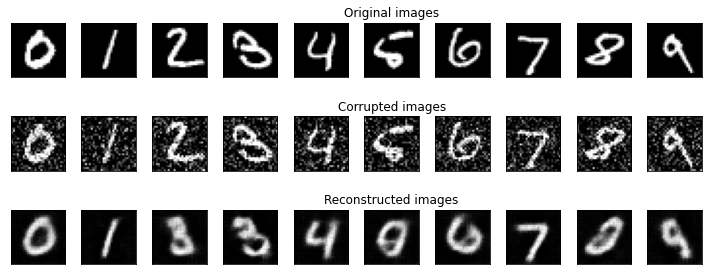

EPOCH 2/30
	 partial train loss (single batch): 0.033492
	 partial train loss (single batch): 0.031897
	 partial train loss (single batch): 0.034412
	 partial train loss (single batch): 0.036264
	 partial train loss (single batch): 0.034227
	 partial train loss (single batch): 0.034308
	 partial train loss (single batch): 0.036618
	 partial train loss (single batch): 0.032250
	 partial train loss (single batch): 0.028521
	 partial train loss (single batch): 0.035000
	 partial train loss (single batch): 0.031239
	 partial train loss (single batch): 0.033433
	 partial train loss (single batch): 0.032567
	 partial train loss (single batch): 0.031758
	 partial train loss (single batch): 0.034725
	 partial train loss (single batch): 0.038277
	 partial train loss (single batch): 0.037356
	 partial train loss (single batch): 0.031712
	 partial train loss (single batch): 0.032665
	 partial train loss (single batch): 0.028330
	 partial train loss (single batch): 0.031938
	 partial train loss (s

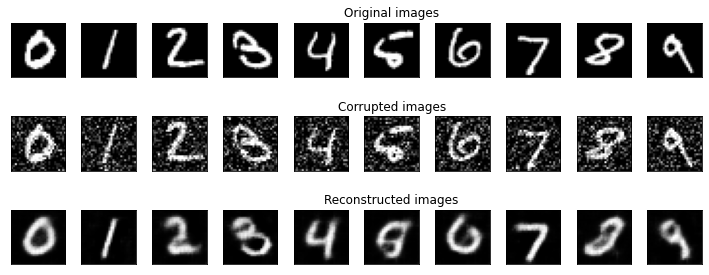

EPOCH 3/30
	 partial train loss (single batch): 0.030984
	 partial train loss (single batch): 0.026308
	 partial train loss (single batch): 0.032171
	 partial train loss (single batch): 0.031030
	 partial train loss (single batch): 0.025607
	 partial train loss (single batch): 0.032483
	 partial train loss (single batch): 0.033937
	 partial train loss (single batch): 0.029466
	 partial train loss (single batch): 0.029430
	 partial train loss (single batch): 0.027804
	 partial train loss (single batch): 0.030528
	 partial train loss (single batch): 0.030166
	 partial train loss (single batch): 0.031960
	 partial train loss (single batch): 0.029077
	 partial train loss (single batch): 0.036171
	 partial train loss (single batch): 0.029922
	 partial train loss (single batch): 0.036547
	 partial train loss (single batch): 0.031541
	 partial train loss (single batch): 0.034148
	 partial train loss (single batch): 0.032206
	 partial train loss (single batch): 0.029477
	 partial train loss (s

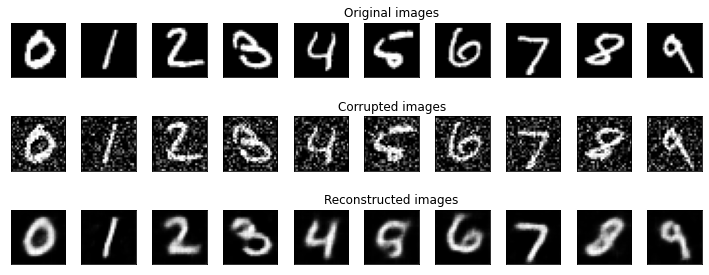

EPOCH 4/30
	 partial train loss (single batch): 0.027839
	 partial train loss (single batch): 0.030508
	 partial train loss (single batch): 0.029379
	 partial train loss (single batch): 0.033012
	 partial train loss (single batch): 0.037586
	 partial train loss (single batch): 0.032659
	 partial train loss (single batch): 0.031367
	 partial train loss (single batch): 0.029682
	 partial train loss (single batch): 0.027669
	 partial train loss (single batch): 0.026232
	 partial train loss (single batch): 0.034314
	 partial train loss (single batch): 0.027611
	 partial train loss (single batch): 0.028828
	 partial train loss (single batch): 0.031362
	 partial train loss (single batch): 0.026898
	 partial train loss (single batch): 0.028625
	 partial train loss (single batch): 0.027296
	 partial train loss (single batch): 0.030983
	 partial train loss (single batch): 0.028885
	 partial train loss (single batch): 0.030534
	 partial train loss (single batch): 0.030244
	 partial train loss (s

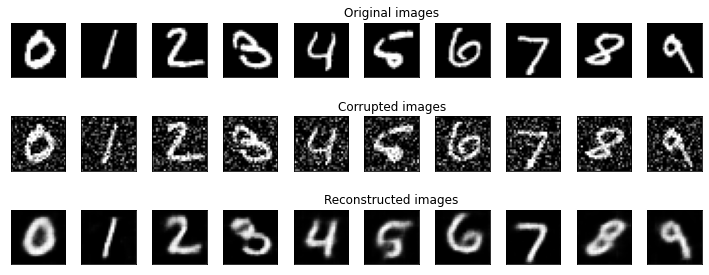

EPOCH 5/30
	 partial train loss (single batch): 0.035925
	 partial train loss (single batch): 0.035246
	 partial train loss (single batch): 0.031994
	 partial train loss (single batch): 0.025091
	 partial train loss (single batch): 0.034240
	 partial train loss (single batch): 0.027709
	 partial train loss (single batch): 0.028347
	 partial train loss (single batch): 0.029611
	 partial train loss (single batch): 0.030689
	 partial train loss (single batch): 0.025894
	 partial train loss (single batch): 0.030937
	 partial train loss (single batch): 0.026433
	 partial train loss (single batch): 0.024500
	 partial train loss (single batch): 0.033724
	 partial train loss (single batch): 0.028199
	 partial train loss (single batch): 0.029820
	 partial train loss (single batch): 0.033757
	 partial train loss (single batch): 0.033564
	 partial train loss (single batch): 0.030020
	 partial train loss (single batch): 0.029156
	 partial train loss (single batch): 0.026853
	 partial train loss (s

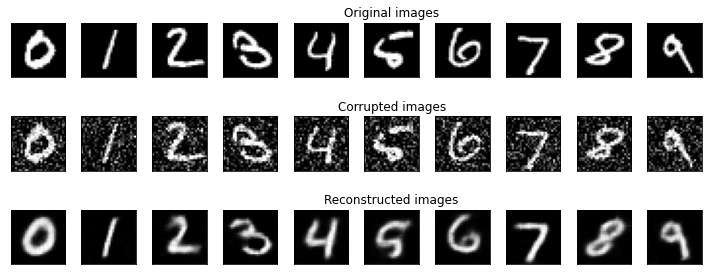

EPOCH 6/30
	 partial train loss (single batch): 0.028797
	 partial train loss (single batch): 0.028072
	 partial train loss (single batch): 0.034549
	 partial train loss (single batch): 0.027661
	 partial train loss (single batch): 0.024512
	 partial train loss (single batch): 0.033718
	 partial train loss (single batch): 0.025058
	 partial train loss (single batch): 0.025521
	 partial train loss (single batch): 0.027394
	 partial train loss (single batch): 0.030569
	 partial train loss (single batch): 0.026628
	 partial train loss (single batch): 0.029796
	 partial train loss (single batch): 0.030516
	 partial train loss (single batch): 0.028373
	 partial train loss (single batch): 0.026220
	 partial train loss (single batch): 0.030470
	 partial train loss (single batch): 0.024983
	 partial train loss (single batch): 0.027173
	 partial train loss (single batch): 0.033040
	 partial train loss (single batch): 0.031131
	 partial train loss (single batch): 0.024447
	 partial train loss (s

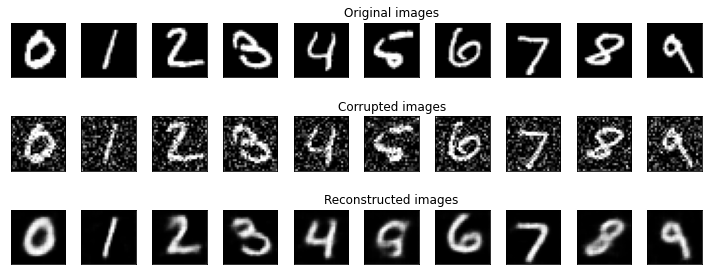

EPOCH 7/30
	 partial train loss (single batch): 0.025807
	 partial train loss (single batch): 0.026969
	 partial train loss (single batch): 0.025898
	 partial train loss (single batch): 0.028472
	 partial train loss (single batch): 0.033110
	 partial train loss (single batch): 0.031673
	 partial train loss (single batch): 0.024824
	 partial train loss (single batch): 0.026989
	 partial train loss (single batch): 0.028311
	 partial train loss (single batch): 0.028894
	 partial train loss (single batch): 0.024264
	 partial train loss (single batch): 0.031461
	 partial train loss (single batch): 0.027918
	 partial train loss (single batch): 0.026863
	 partial train loss (single batch): 0.030245
	 partial train loss (single batch): 0.024376
	 partial train loss (single batch): 0.030064
	 partial train loss (single batch): 0.030336
	 partial train loss (single batch): 0.027431
	 partial train loss (single batch): 0.027160
	 partial train loss (single batch): 0.025653
	 partial train loss (s

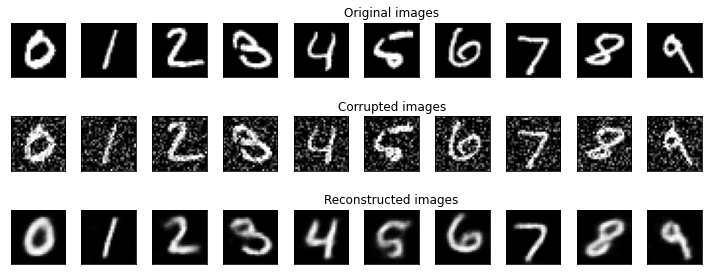

EPOCH 8/30
	 partial train loss (single batch): 0.027478
	 partial train loss (single batch): 0.028646
	 partial train loss (single batch): 0.027525
	 partial train loss (single batch): 0.028080
	 partial train loss (single batch): 0.027369
	 partial train loss (single batch): 0.028787
	 partial train loss (single batch): 0.025043
	 partial train loss (single batch): 0.026916
	 partial train loss (single batch): 0.030853
	 partial train loss (single batch): 0.025084
	 partial train loss (single batch): 0.027301
	 partial train loss (single batch): 0.027265
	 partial train loss (single batch): 0.028384
	 partial train loss (single batch): 0.030600
	 partial train loss (single batch): 0.027206
	 partial train loss (single batch): 0.025786
	 partial train loss (single batch): 0.028093
	 partial train loss (single batch): 0.026506
	 partial train loss (single batch): 0.032276
	 partial train loss (single batch): 0.024138
	 partial train loss (single batch): 0.029487
	 partial train loss (s

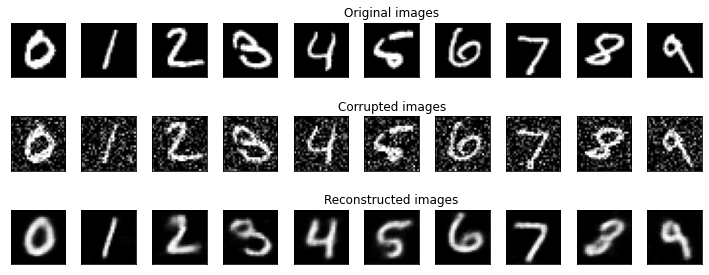

EPOCH 9/30
	 partial train loss (single batch): 0.028947
	 partial train loss (single batch): 0.023254
	 partial train loss (single batch): 0.025201
	 partial train loss (single batch): 0.026907
	 partial train loss (single batch): 0.029409
	 partial train loss (single batch): 0.026369
	 partial train loss (single batch): 0.032153
	 partial train loss (single batch): 0.030596
	 partial train loss (single batch): 0.024714
	 partial train loss (single batch): 0.023534
	 partial train loss (single batch): 0.036191
	 partial train loss (single batch): 0.028159
	 partial train loss (single batch): 0.027449
	 partial train loss (single batch): 0.027380
	 partial train loss (single batch): 0.032151
	 partial train loss (single batch): 0.032203
	 partial train loss (single batch): 0.028168
	 partial train loss (single batch): 0.031351
	 partial train loss (single batch): 0.027715
	 partial train loss (single batch): 0.027648
	 partial train loss (single batch): 0.031935
	 partial train loss (s

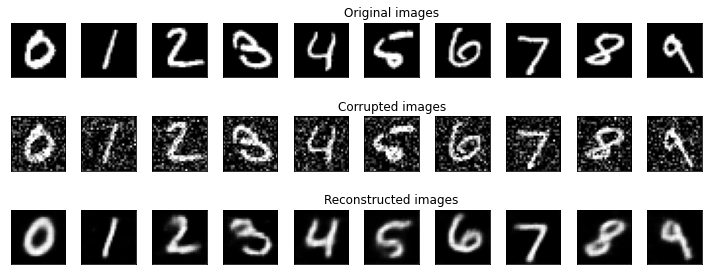

EPOCH 10/30
	 partial train loss (single batch): 0.030747
	 partial train loss (single batch): 0.028672
	 partial train loss (single batch): 0.025375
	 partial train loss (single batch): 0.023750
	 partial train loss (single batch): 0.027705
	 partial train loss (single batch): 0.027941
	 partial train loss (single batch): 0.026162
	 partial train loss (single batch): 0.022085
	 partial train loss (single batch): 0.025625
	 partial train loss (single batch): 0.027217
	 partial train loss (single batch): 0.026691
	 partial train loss (single batch): 0.027438
	 partial train loss (single batch): 0.023109
	 partial train loss (single batch): 0.026004
	 partial train loss (single batch): 0.024728
	 partial train loss (single batch): 0.025799
	 partial train loss (single batch): 0.025836
	 partial train loss (single batch): 0.026284
	 partial train loss (single batch): 0.026421
	 partial train loss (single batch): 0.025094
	 partial train loss (single batch): 0.024230
	 partial train loss (

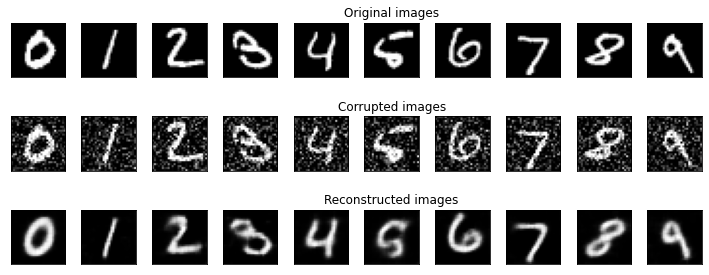

EPOCH 11/30
	 partial train loss (single batch): 0.031452
	 partial train loss (single batch): 0.025273
	 partial train loss (single batch): 0.034006
	 partial train loss (single batch): 0.028096
	 partial train loss (single batch): 0.025969
	 partial train loss (single batch): 0.028765
	 partial train loss (single batch): 0.024275
	 partial train loss (single batch): 0.027041
	 partial train loss (single batch): 0.021942
	 partial train loss (single batch): 0.030823
	 partial train loss (single batch): 0.028230
	 partial train loss (single batch): 0.030239
	 partial train loss (single batch): 0.025182
	 partial train loss (single batch): 0.026981
	 partial train loss (single batch): 0.027570
	 partial train loss (single batch): 0.028378
	 partial train loss (single batch): 0.028463
	 partial train loss (single batch): 0.028550
	 partial train loss (single batch): 0.029827
	 partial train loss (single batch): 0.028012
	 partial train loss (single batch): 0.025919
	 partial train loss (

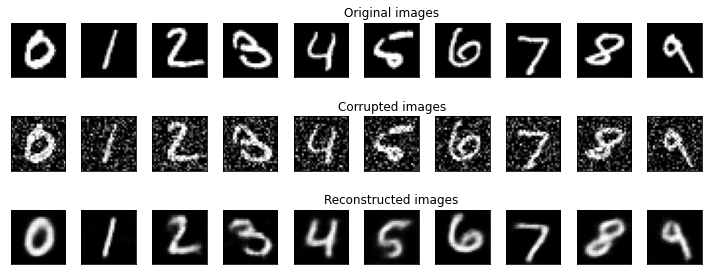

EPOCH 12/30
	 partial train loss (single batch): 0.030820
	 partial train loss (single batch): 0.024989
	 partial train loss (single batch): 0.024696
	 partial train loss (single batch): 0.031531
	 partial train loss (single batch): 0.026917
	 partial train loss (single batch): 0.023944
	 partial train loss (single batch): 0.028425
	 partial train loss (single batch): 0.036482
	 partial train loss (single batch): 0.027604
	 partial train loss (single batch): 0.028985
	 partial train loss (single batch): 0.026575
	 partial train loss (single batch): 0.029169
	 partial train loss (single batch): 0.027034
	 partial train loss (single batch): 0.026434
	 partial train loss (single batch): 0.027804
	 partial train loss (single batch): 0.027392
	 partial train loss (single batch): 0.031195
	 partial train loss (single batch): 0.026152
	 partial train loss (single batch): 0.024444
	 partial train loss (single batch): 0.031659
	 partial train loss (single batch): 0.031053
	 partial train loss (

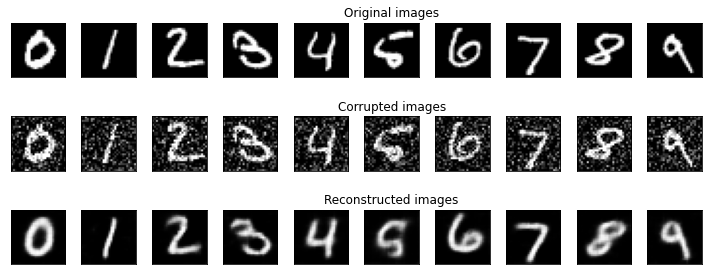

EPOCH 13/30
	 partial train loss (single batch): 0.026852
	 partial train loss (single batch): 0.025237
	 partial train loss (single batch): 0.023533
	 partial train loss (single batch): 0.023392
	 partial train loss (single batch): 0.033665
	 partial train loss (single batch): 0.026255
	 partial train loss (single batch): 0.026263
	 partial train loss (single batch): 0.028743
	 partial train loss (single batch): 0.025547
	 partial train loss (single batch): 0.027171
	 partial train loss (single batch): 0.024972
	 partial train loss (single batch): 0.025039
	 partial train loss (single batch): 0.030325
	 partial train loss (single batch): 0.027369
	 partial train loss (single batch): 0.025465
	 partial train loss (single batch): 0.027906
	 partial train loss (single batch): 0.029831
	 partial train loss (single batch): 0.024475
	 partial train loss (single batch): 0.026234
	 partial train loss (single batch): 0.026940
	 partial train loss (single batch): 0.028202
	 partial train loss (

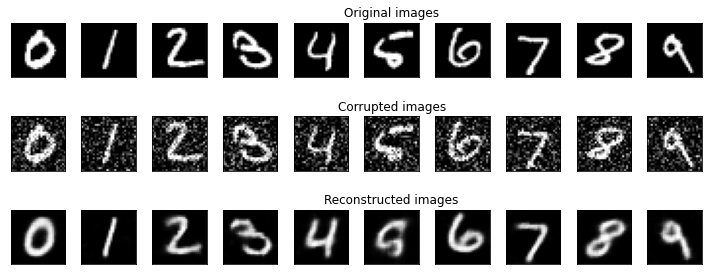

EPOCH 14/30
	 partial train loss (single batch): 0.029165
	 partial train loss (single batch): 0.030554
	 partial train loss (single batch): 0.030186
	 partial train loss (single batch): 0.025856
	 partial train loss (single batch): 0.027866
	 partial train loss (single batch): 0.023807
	 partial train loss (single batch): 0.029651
	 partial train loss (single batch): 0.025656
	 partial train loss (single batch): 0.027656
	 partial train loss (single batch): 0.024709
	 partial train loss (single batch): 0.029788
	 partial train loss (single batch): 0.022725
	 partial train loss (single batch): 0.026838
	 partial train loss (single batch): 0.029601
	 partial train loss (single batch): 0.027329
	 partial train loss (single batch): 0.028112
	 partial train loss (single batch): 0.026946
	 partial train loss (single batch): 0.029423
	 partial train loss (single batch): 0.029634
	 partial train loss (single batch): 0.026101
	 partial train loss (single batch): 0.028451
	 partial train loss (

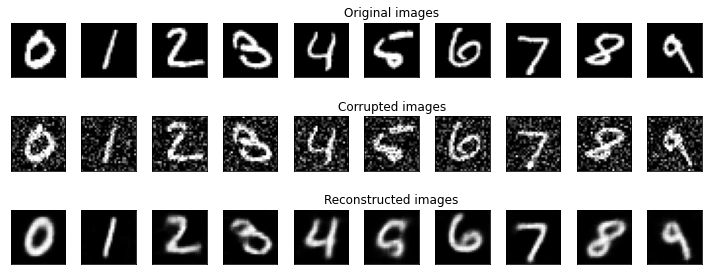

EPOCH 15/30
	 partial train loss (single batch): 0.027932
	 partial train loss (single batch): 0.030359
	 partial train loss (single batch): 0.025895
	 partial train loss (single batch): 0.028292
	 partial train loss (single batch): 0.026090
	 partial train loss (single batch): 0.027668
	 partial train loss (single batch): 0.027650
	 partial train loss (single batch): 0.029825
	 partial train loss (single batch): 0.024722
	 partial train loss (single batch): 0.025520
	 partial train loss (single batch): 0.028752
	 partial train loss (single batch): 0.029535
	 partial train loss (single batch): 0.023046
	 partial train loss (single batch): 0.029107
	 partial train loss (single batch): 0.025447
	 partial train loss (single batch): 0.029375
	 partial train loss (single batch): 0.025925
	 partial train loss (single batch): 0.028899
	 partial train loss (single batch): 0.031377
	 partial train loss (single batch): 0.024332
	 partial train loss (single batch): 0.027599
	 partial train loss (

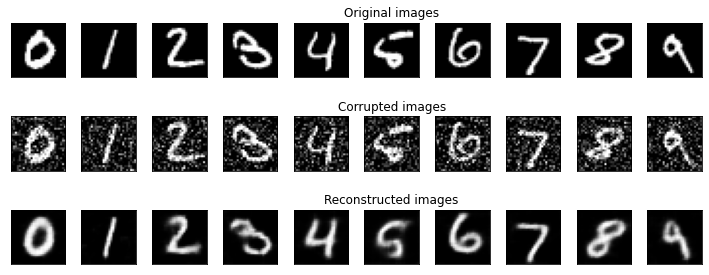

EPOCH 16/30
	 partial train loss (single batch): 0.027870
	 partial train loss (single batch): 0.028007
	 partial train loss (single batch): 0.025040
	 partial train loss (single batch): 0.029073
	 partial train loss (single batch): 0.031028
	 partial train loss (single batch): 0.029365
	 partial train loss (single batch): 0.022969
	 partial train loss (single batch): 0.030896
	 partial train loss (single batch): 0.027812
	 partial train loss (single batch): 0.030794
	 partial train loss (single batch): 0.028010
	 partial train loss (single batch): 0.027951
	 partial train loss (single batch): 0.027256
	 partial train loss (single batch): 0.028167
	 partial train loss (single batch): 0.028122
	 partial train loss (single batch): 0.025826
	 partial train loss (single batch): 0.030097
	 partial train loss (single batch): 0.027807
	 partial train loss (single batch): 0.020844
	 partial train loss (single batch): 0.023896
	 partial train loss (single batch): 0.022631
	 partial train loss (

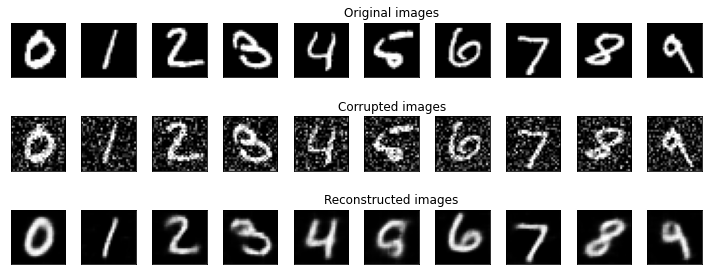

EPOCH 17/30
	 partial train loss (single batch): 0.024040
	 partial train loss (single batch): 0.027064
	 partial train loss (single batch): 0.024851
	 partial train loss (single batch): 0.024824
	 partial train loss (single batch): 0.021900
	 partial train loss (single batch): 0.025725
	 partial train loss (single batch): 0.029666
	 partial train loss (single batch): 0.029030
	 partial train loss (single batch): 0.026757
	 partial train loss (single batch): 0.023450
	 partial train loss (single batch): 0.028431
	 partial train loss (single batch): 0.025431
	 partial train loss (single batch): 0.024768
	 partial train loss (single batch): 0.025199
	 partial train loss (single batch): 0.027088
	 partial train loss (single batch): 0.028167
	 partial train loss (single batch): 0.028031
	 partial train loss (single batch): 0.029991
	 partial train loss (single batch): 0.028608
	 partial train loss (single batch): 0.025425
	 partial train loss (single batch): 0.027814
	 partial train loss (

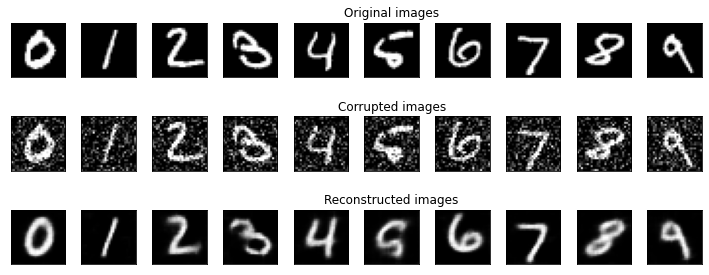

EPOCH 18/30
	 partial train loss (single batch): 0.025758
	 partial train loss (single batch): 0.030257
	 partial train loss (single batch): 0.028718
	 partial train loss (single batch): 0.023891
	 partial train loss (single batch): 0.027740
	 partial train loss (single batch): 0.027430
	 partial train loss (single batch): 0.028390
	 partial train loss (single batch): 0.027368
	 partial train loss (single batch): 0.027395
	 partial train loss (single batch): 0.028883
	 partial train loss (single batch): 0.026379
	 partial train loss (single batch): 0.026811
	 partial train loss (single batch): 0.024372
	 partial train loss (single batch): 0.023729
	 partial train loss (single batch): 0.027000
	 partial train loss (single batch): 0.026534
	 partial train loss (single batch): 0.024916
	 partial train loss (single batch): 0.028248
	 partial train loss (single batch): 0.027847
	 partial train loss (single batch): 0.027760
	 partial train loss (single batch): 0.031452
	 partial train loss (

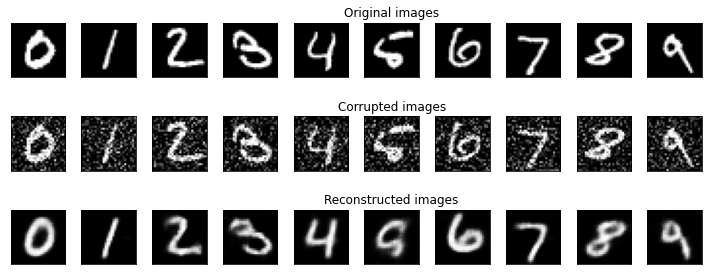

EPOCH 19/30
	 partial train loss (single batch): 0.022818
	 partial train loss (single batch): 0.024767
	 partial train loss (single batch): 0.024831
	 partial train loss (single batch): 0.027654
	 partial train loss (single batch): 0.028811
	 partial train loss (single batch): 0.021538
	 partial train loss (single batch): 0.029368
	 partial train loss (single batch): 0.027845
	 partial train loss (single batch): 0.025836
	 partial train loss (single batch): 0.030410
	 partial train loss (single batch): 0.027499
	 partial train loss (single batch): 0.033110
	 partial train loss (single batch): 0.030727
	 partial train loss (single batch): 0.026923
	 partial train loss (single batch): 0.024355
	 partial train loss (single batch): 0.025656
	 partial train loss (single batch): 0.027019
	 partial train loss (single batch): 0.027238
	 partial train loss (single batch): 0.030443
	 partial train loss (single batch): 0.023979
	 partial train loss (single batch): 0.026411
	 partial train loss (

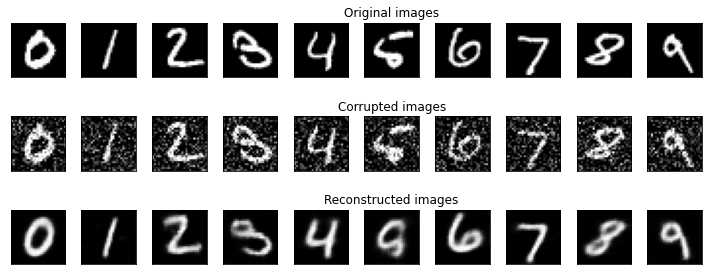

EPOCH 20/30
	 partial train loss (single batch): 0.029350
	 partial train loss (single batch): 0.028722
	 partial train loss (single batch): 0.027257
	 partial train loss (single batch): 0.026773
	 partial train loss (single batch): 0.030067
	 partial train loss (single batch): 0.021365
	 partial train loss (single batch): 0.028336
	 partial train loss (single batch): 0.025237
	 partial train loss (single batch): 0.027089
	 partial train loss (single batch): 0.031734
	 partial train loss (single batch): 0.025144
	 partial train loss (single batch): 0.025740
	 partial train loss (single batch): 0.022626
	 partial train loss (single batch): 0.028898
	 partial train loss (single batch): 0.022516
	 partial train loss (single batch): 0.026010
	 partial train loss (single batch): 0.022848
	 partial train loss (single batch): 0.032711
	 partial train loss (single batch): 0.028625
	 partial train loss (single batch): 0.030246
	 partial train loss (single batch): 0.028588
	 partial train loss (

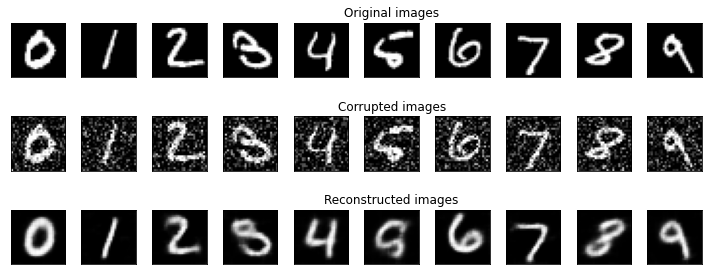

EPOCH 21/30
	 partial train loss (single batch): 0.030615
	 partial train loss (single batch): 0.023258
	 partial train loss (single batch): 0.029660
	 partial train loss (single batch): 0.032787
	 partial train loss (single batch): 0.024848
	 partial train loss (single batch): 0.027832
	 partial train loss (single batch): 0.025661
	 partial train loss (single batch): 0.024729
	 partial train loss (single batch): 0.027097
	 partial train loss (single batch): 0.026048
	 partial train loss (single batch): 0.028391
	 partial train loss (single batch): 0.024059
	 partial train loss (single batch): 0.028322
	 partial train loss (single batch): 0.028050
	 partial train loss (single batch): 0.022693
	 partial train loss (single batch): 0.026144
	 partial train loss (single batch): 0.026922
	 partial train loss (single batch): 0.029125
	 partial train loss (single batch): 0.029312
	 partial train loss (single batch): 0.028089
	 partial train loss (single batch): 0.026156
	 partial train loss (

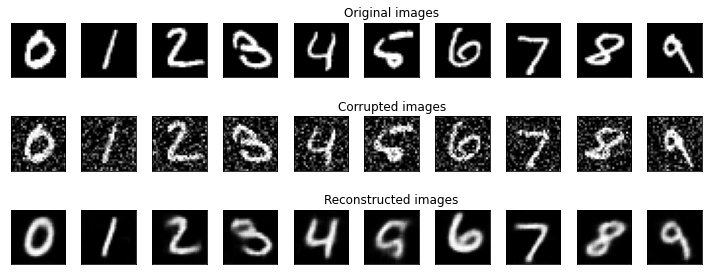

EPOCH 22/30
	 partial train loss (single batch): 0.024604
	 partial train loss (single batch): 0.025958
	 partial train loss (single batch): 0.024489
	 partial train loss (single batch): 0.025291
	 partial train loss (single batch): 0.026022
	 partial train loss (single batch): 0.026702
	 partial train loss (single batch): 0.029799
	 partial train loss (single batch): 0.031056
	 partial train loss (single batch): 0.031320
	 partial train loss (single batch): 0.024441
	 partial train loss (single batch): 0.030002
	 partial train loss (single batch): 0.022647
	 partial train loss (single batch): 0.031212
	 partial train loss (single batch): 0.024671
	 partial train loss (single batch): 0.023733
	 partial train loss (single batch): 0.026855
	 partial train loss (single batch): 0.029873
	 partial train loss (single batch): 0.026015
	 partial train loss (single batch): 0.023121
	 partial train loss (single batch): 0.027112
	 partial train loss (single batch): 0.027256
	 partial train loss (

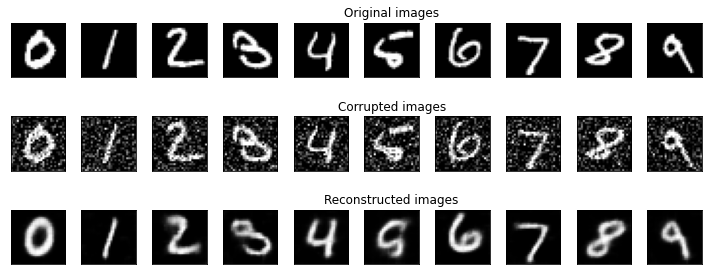

EPOCH 23/30
	 partial train loss (single batch): 0.023561
	 partial train loss (single batch): 0.024627
	 partial train loss (single batch): 0.026054
	 partial train loss (single batch): 0.029600
	 partial train loss (single batch): 0.027481
	 partial train loss (single batch): 0.024534
	 partial train loss (single batch): 0.025741
	 partial train loss (single batch): 0.028843
	 partial train loss (single batch): 0.026614
	 partial train loss (single batch): 0.024211
	 partial train loss (single batch): 0.025020
	 partial train loss (single batch): 0.033198
	 partial train loss (single batch): 0.026333
	 partial train loss (single batch): 0.024211
	 partial train loss (single batch): 0.029383
	 partial train loss (single batch): 0.027137
	 partial train loss (single batch): 0.026692
	 partial train loss (single batch): 0.027802
	 partial train loss (single batch): 0.029259
	 partial train loss (single batch): 0.028543
	 partial train loss (single batch): 0.025784
	 partial train loss (

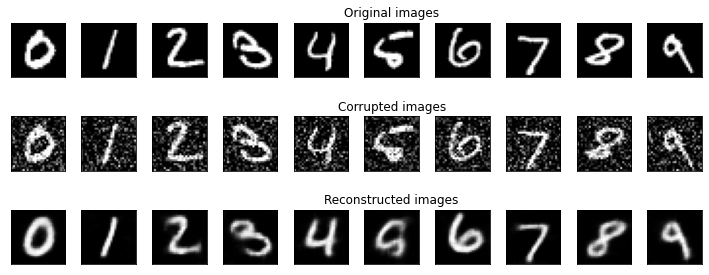

EPOCH 24/30
	 partial train loss (single batch): 0.026749
	 partial train loss (single batch): 0.021844
	 partial train loss (single batch): 0.023592
	 partial train loss (single batch): 0.023344
	 partial train loss (single batch): 0.030100
	 partial train loss (single batch): 0.025678
	 partial train loss (single batch): 0.028673
	 partial train loss (single batch): 0.028608
	 partial train loss (single batch): 0.022333
	 partial train loss (single batch): 0.025351
	 partial train loss (single batch): 0.023662
	 partial train loss (single batch): 0.032574
	 partial train loss (single batch): 0.025969
	 partial train loss (single batch): 0.023712
	 partial train loss (single batch): 0.026605
	 partial train loss (single batch): 0.025130
	 partial train loss (single batch): 0.025930
	 partial train loss (single batch): 0.027401
	 partial train loss (single batch): 0.025006
	 partial train loss (single batch): 0.026739
	 partial train loss (single batch): 0.028128
	 partial train loss (

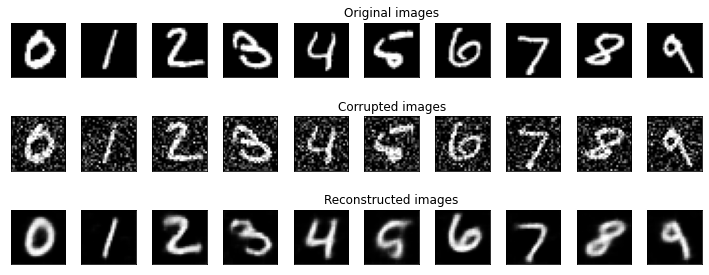

EPOCH 25/30
	 partial train loss (single batch): 0.021610
	 partial train loss (single batch): 0.021886
	 partial train loss (single batch): 0.027235
	 partial train loss (single batch): 0.023100
	 partial train loss (single batch): 0.026761
	 partial train loss (single batch): 0.026211
	 partial train loss (single batch): 0.025489
	 partial train loss (single batch): 0.025198
	 partial train loss (single batch): 0.025496
	 partial train loss (single batch): 0.024862
	 partial train loss (single batch): 0.029163
	 partial train loss (single batch): 0.026027
	 partial train loss (single batch): 0.027332
	 partial train loss (single batch): 0.023353
	 partial train loss (single batch): 0.028095
	 partial train loss (single batch): 0.026086
	 partial train loss (single batch): 0.026070
	 partial train loss (single batch): 0.023897
	 partial train loss (single batch): 0.027751
	 partial train loss (single batch): 0.025696
	 partial train loss (single batch): 0.028745
	 partial train loss (

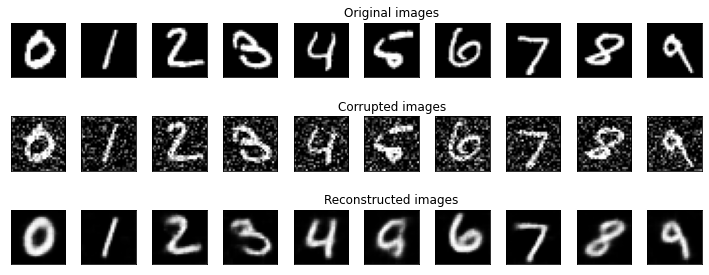

EPOCH 26/30
	 partial train loss (single batch): 0.024043
	 partial train loss (single batch): 0.029167
	 partial train loss (single batch): 0.026855
	 partial train loss (single batch): 0.026846
	 partial train loss (single batch): 0.030931
	 partial train loss (single batch): 0.027201
	 partial train loss (single batch): 0.027157
	 partial train loss (single batch): 0.027094
	 partial train loss (single batch): 0.024138
	 partial train loss (single batch): 0.029032
	 partial train loss (single batch): 0.026694
	 partial train loss (single batch): 0.026326
	 partial train loss (single batch): 0.027389
	 partial train loss (single batch): 0.029662
	 partial train loss (single batch): 0.025629
	 partial train loss (single batch): 0.022890
	 partial train loss (single batch): 0.025687
	 partial train loss (single batch): 0.028010
	 partial train loss (single batch): 0.022209
	 partial train loss (single batch): 0.022127
	 partial train loss (single batch): 0.030538
	 partial train loss (

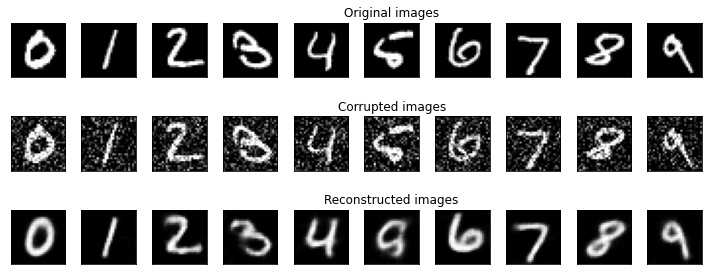

EPOCH 27/30
	 partial train loss (single batch): 0.027460
	 partial train loss (single batch): 0.026348
	 partial train loss (single batch): 0.027440
	 partial train loss (single batch): 0.024219
	 partial train loss (single batch): 0.028439
	 partial train loss (single batch): 0.023182
	 partial train loss (single batch): 0.021749
	 partial train loss (single batch): 0.027557
	 partial train loss (single batch): 0.024468
	 partial train loss (single batch): 0.028977
	 partial train loss (single batch): 0.022320
	 partial train loss (single batch): 0.023185
	 partial train loss (single batch): 0.026526
	 partial train loss (single batch): 0.027338
	 partial train loss (single batch): 0.028116
	 partial train loss (single batch): 0.028488
	 partial train loss (single batch): 0.029169
	 partial train loss (single batch): 0.028570
	 partial train loss (single batch): 0.031101
	 partial train loss (single batch): 0.025135
	 partial train loss (single batch): 0.025011
	 partial train loss (

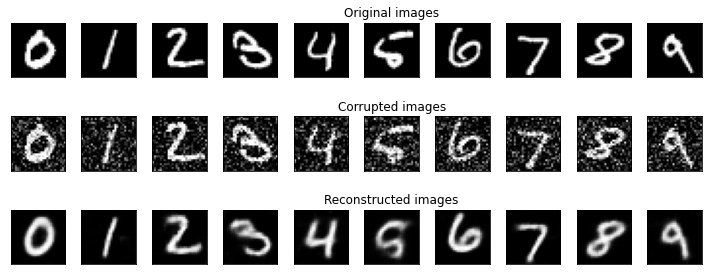

EPOCH 28/30
	 partial train loss (single batch): 0.023991
	 partial train loss (single batch): 0.028410
	 partial train loss (single batch): 0.027013
	 partial train loss (single batch): 0.027897
	 partial train loss (single batch): 0.026016
	 partial train loss (single batch): 0.026569
	 partial train loss (single batch): 0.027505
	 partial train loss (single batch): 0.024967
	 partial train loss (single batch): 0.021171
	 partial train loss (single batch): 0.026174
	 partial train loss (single batch): 0.028494
	 partial train loss (single batch): 0.026974
	 partial train loss (single batch): 0.027274
	 partial train loss (single batch): 0.029259
	 partial train loss (single batch): 0.029326
	 partial train loss (single batch): 0.026400
	 partial train loss (single batch): 0.028277
	 partial train loss (single batch): 0.024655
	 partial train loss (single batch): 0.034167
	 partial train loss (single batch): 0.025547
	 partial train loss (single batch): 0.028468
	 partial train loss (

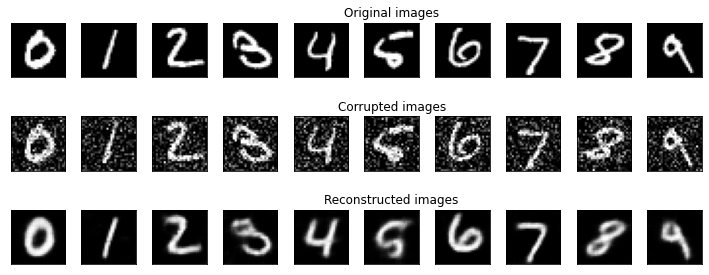

EPOCH 29/30
	 partial train loss (single batch): 0.025688
	 partial train loss (single batch): 0.023934
	 partial train loss (single batch): 0.025294
	 partial train loss (single batch): 0.023284
	 partial train loss (single batch): 0.026571
	 partial train loss (single batch): 0.027254
	 partial train loss (single batch): 0.023898
	 partial train loss (single batch): 0.024727
	 partial train loss (single batch): 0.020398
	 partial train loss (single batch): 0.025966
	 partial train loss (single batch): 0.032260
	 partial train loss (single batch): 0.028587
	 partial train loss (single batch): 0.025462
	 partial train loss (single batch): 0.030564
	 partial train loss (single batch): 0.022556
	 partial train loss (single batch): 0.028479
	 partial train loss (single batch): 0.023838
	 partial train loss (single batch): 0.023008
	 partial train loss (single batch): 0.026011
	 partial train loss (single batch): 0.028961
	 partial train loss (single batch): 0.031285
	 partial train loss (

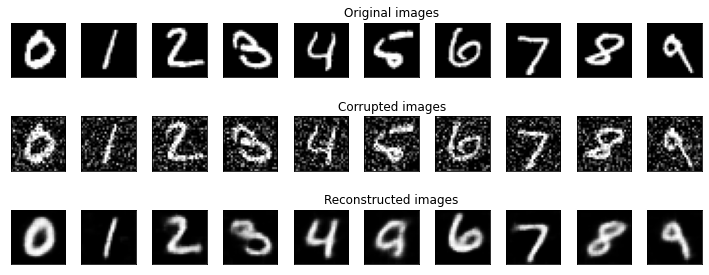

EPOCH 30/30
	 partial train loss (single batch): 0.027103
	 partial train loss (single batch): 0.028905
	 partial train loss (single batch): 0.025212
	 partial train loss (single batch): 0.027311
	 partial train loss (single batch): 0.028270
	 partial train loss (single batch): 0.030508
	 partial train loss (single batch): 0.024227
	 partial train loss (single batch): 0.024858
	 partial train loss (single batch): 0.028661
	 partial train loss (single batch): 0.025036
	 partial train loss (single batch): 0.028967
	 partial train loss (single batch): 0.026561
	 partial train loss (single batch): 0.027476
	 partial train loss (single batch): 0.027330
	 partial train loss (single batch): 0.022370
	 partial train loss (single batch): 0.027726
	 partial train loss (single batch): 0.025644
	 partial train loss (single batch): 0.025628
	 partial train loss (single batch): 0.028611
	 partial train loss (single batch): 0.025291
	 partial train loss (single batch): 0.022193
	 partial train loss (

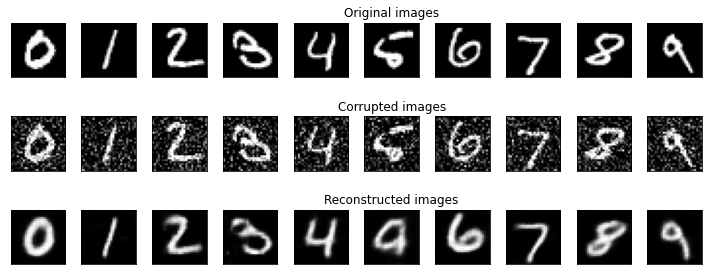

In [ ]:

def plot_ten_images(model, n = 10, noise_factor = 0.3):
    plt.figure(figsize=(16,4.5))
    targets = test_dataset.targets.numpy()
    t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}    
    for i in range(n):

      ax = plt.subplot(3,n,i+1)
#      img = test_dataset[t_idx[i]][0].unsqueeze(0)
      img = test_dataset[t_idx[i]][0].unsqueeze(0)
      image_noisy = img + torch.randn_like(img) * noise_factor
        #noisy = image + torch.normal(mean = noise_factor, std = noise_factor, size=image.shape)
      image_noisy = torch.clip(image_noisy,0.,1.)


      #image_noisy = add_noise(img,noise_factor)     
      image_noisy = image_noisy.to(device)

      #encoder.eval()
      #decoder.eval()
      model.eval()

      with torch.no_grad():
         rec_img  = model(image_noisy)#decoder(encoder(image_noisy))

      plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(3, n, i + 1 + n)
      plt.imshow(image_noisy.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Corrupted images')

      ax = plt.subplot(3, n, i + 1 + n + n)
      plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.7, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.3)     
    plt.show() 

noise_factor = 0.3
num_epochs = 30
history_da={'train_loss':[],'val_loss':[]}

for epoch in range(num_epochs):
    print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    ### Training (use the training function)
    train_loss=train_in_epoch(model, device, train_loader, loss_fn, optim, noise_factor)
    ### Validation  (use the testing function)
    val_loss = test_in_epoch(model, device, valid_loader, loss_fn, noise_factor)
    # Print Validationloss
    history_da['train_loss'].append(train_loss)
    history_da['val_loss'].append(val_loss)
    print('\n EPOCH {}/{} \t train loss {:.3f} \t val loss {:.3f}'.format(epoch + 1, num_epochs,train_loss,val_loss))
    plot_ten_images(model, noise_factor = noise_factor)      

EPOCH 1/10
	 partial train loss (single batch): 0.025877
	 partial train loss (single batch): 0.029278
	 partial train loss (single batch): 0.027632
	 partial train loss (single batch): 0.023431
	 partial train loss (single batch): 0.029394
	 partial train loss (single batch): 0.026066
	 partial train loss (single batch): 0.028273
	 partial train loss (single batch): 0.026878
	 partial train loss (single batch): 0.023939
	 partial train loss (single batch): 0.027403
	 partial train loss (single batch): 0.031688
	 partial train loss (single batch): 0.025355
	 partial train loss (single batch): 0.028086
	 partial train loss (single batch): 0.024689
	 partial train loss (single batch): 0.028407
	 partial train loss (single batch): 0.024716
	 partial train loss (single batch): 0.025385
	 partial train loss (single batch): 0.025168
	 partial train loss (single batch): 0.026184
	 partial train loss (single batch): 0.032991
	 partial train loss (single batch): 0.021474
	 partial train loss (s

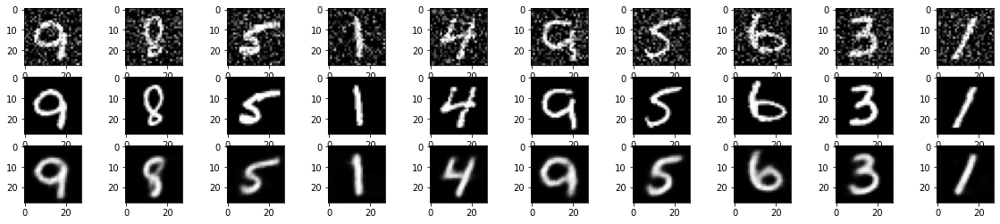

EPOCH 2/10
	 partial train loss (single batch): 0.022775
	 partial train loss (single batch): 0.026221
	 partial train loss (single batch): 0.025859
	 partial train loss (single batch): 0.022240
	 partial train loss (single batch): 0.027030
	 partial train loss (single batch): 0.023617
	 partial train loss (single batch): 0.027116
	 partial train loss (single batch): 0.023786
	 partial train loss (single batch): 0.026178
	 partial train loss (single batch): 0.025673
	 partial train loss (single batch): 0.023712
	 partial train loss (single batch): 0.025834
	 partial train loss (single batch): 0.027771
	 partial train loss (single batch): 0.026755
	 partial train loss (single batch): 0.020436
	 partial train loss (single batch): 0.028202
	 partial train loss (single batch): 0.029782
	 partial train loss (single batch): 0.027779
	 partial train loss (single batch): 0.023174
	 partial train loss (single batch): 0.023877
	 partial train loss (single batch): 0.025757
	 partial train loss (s

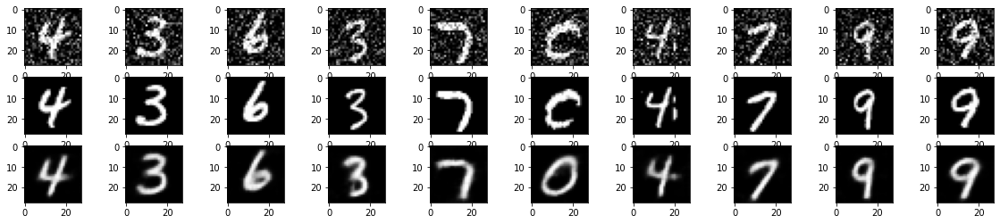

EPOCH 3/10
	 partial train loss (single batch): 0.025388
	 partial train loss (single batch): 0.022474
	 partial train loss (single batch): 0.021751
	 partial train loss (single batch): 0.024491
	 partial train loss (single batch): 0.032780
	 partial train loss (single batch): 0.022820
	 partial train loss (single batch): 0.026478
	 partial train loss (single batch): 0.025962
	 partial train loss (single batch): 0.024867
	 partial train loss (single batch): 0.027043
	 partial train loss (single batch): 0.024372
	 partial train loss (single batch): 0.025946
	 partial train loss (single batch): 0.031445
	 partial train loss (single batch): 0.026223
	 partial train loss (single batch): 0.023839
	 partial train loss (single batch): 0.026893
	 partial train loss (single batch): 0.027640
	 partial train loss (single batch): 0.022321
	 partial train loss (single batch): 0.026048
	 partial train loss (single batch): 0.030273
	 partial train loss (single batch): 0.024805
	 partial train loss (s

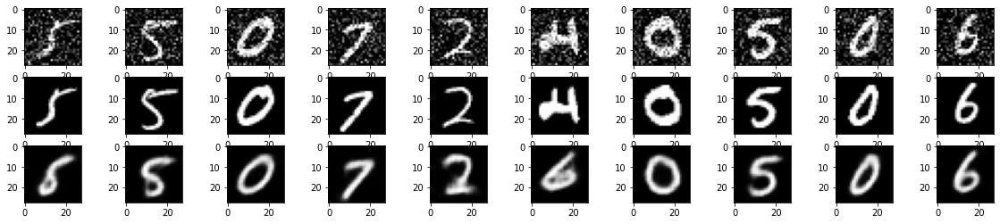

EPOCH 4/10
	 partial train loss (single batch): 0.025237
	 partial train loss (single batch): 0.028803
	 partial train loss (single batch): 0.024168
	 partial train loss (single batch): 0.024634
	 partial train loss (single batch): 0.026554
	 partial train loss (single batch): 0.025938
	 partial train loss (single batch): 0.027980
	 partial train loss (single batch): 0.026760
	 partial train loss (single batch): 0.026310
	 partial train loss (single batch): 0.026879
	 partial train loss (single batch): 0.020106
	 partial train loss (single batch): 0.024502
	 partial train loss (single batch): 0.022648
	 partial train loss (single batch): 0.029401
	 partial train loss (single batch): 0.024010
	 partial train loss (single batch): 0.023494
	 partial train loss (single batch): 0.023935
	 partial train loss (single batch): 0.028834
	 partial train loss (single batch): 0.026034
	 partial train loss (single batch): 0.026902
	 partial train loss (single batch): 0.030414
	 partial train loss (s

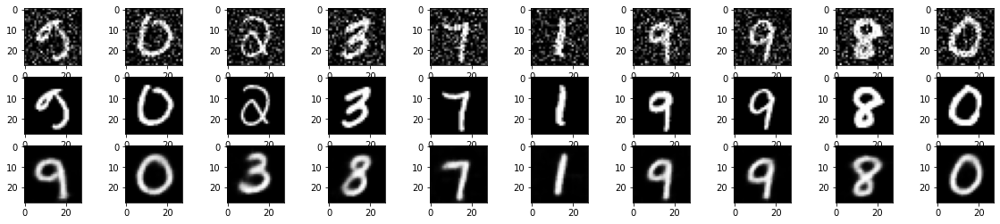

EPOCH 5/10
	 partial train loss (single batch): 0.029908
	 partial train loss (single batch): 0.028589
	 partial train loss (single batch): 0.026378
	 partial train loss (single batch): 0.023646
	 partial train loss (single batch): 0.026169
	 partial train loss (single batch): 0.029243
	 partial train loss (single batch): 0.029262
	 partial train loss (single batch): 0.026178
	 partial train loss (single batch): 0.027351
	 partial train loss (single batch): 0.025328
	 partial train loss (single batch): 0.031252
	 partial train loss (single batch): 0.023741
	 partial train loss (single batch): 0.031538
	 partial train loss (single batch): 0.025862
	 partial train loss (single batch): 0.030222
	 partial train loss (single batch): 0.026995
	 partial train loss (single batch): 0.019753
	 partial train loss (single batch): 0.030473
	 partial train loss (single batch): 0.025428
	 partial train loss (single batch): 0.029679
	 partial train loss (single batch): 0.025137
	 partial train loss (s

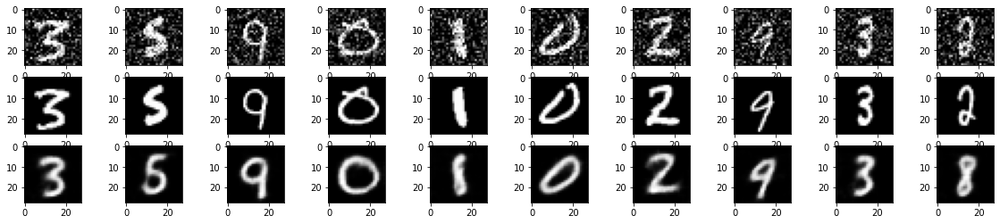

EPOCH 6/10
	 partial train loss (single batch): 0.024889
	 partial train loss (single batch): 0.027414
	 partial train loss (single batch): 0.027857
	 partial train loss (single batch): 0.024876
	 partial train loss (single batch): 0.027123
	 partial train loss (single batch): 0.030503
	 partial train loss (single batch): 0.027892
	 partial train loss (single batch): 0.028494
	 partial train loss (single batch): 0.028110
	 partial train loss (single batch): 0.020596
	 partial train loss (single batch): 0.024425
	 partial train loss (single batch): 0.022672
	 partial train loss (single batch): 0.026154
	 partial train loss (single batch): 0.029798
	 partial train loss (single batch): 0.026238
	 partial train loss (single batch): 0.028209
	 partial train loss (single batch): 0.024980
	 partial train loss (single batch): 0.026402
	 partial train loss (single batch): 0.028947
	 partial train loss (single batch): 0.028206
	 partial train loss (single batch): 0.027204
	 partial train loss (s

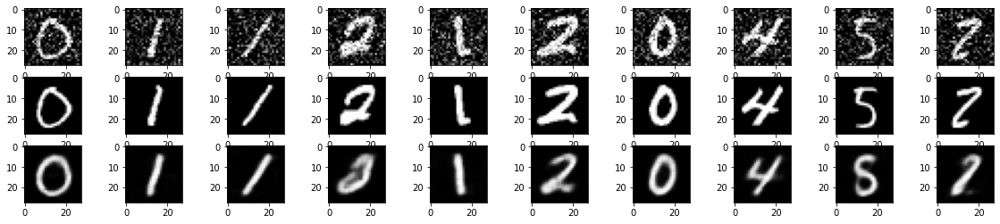

EPOCH 7/10
	 partial train loss (single batch): 0.029174
	 partial train loss (single batch): 0.024547
	 partial train loss (single batch): 0.024514
	 partial train loss (single batch): 0.028402
	 partial train loss (single batch): 0.028996
	 partial train loss (single batch): 0.027033
	 partial train loss (single batch): 0.025790
	 partial train loss (single batch): 0.024284
	 partial train loss (single batch): 0.028907
	 partial train loss (single batch): 0.029996
	 partial train loss (single batch): 0.030726
	 partial train loss (single batch): 0.026798
	 partial train loss (single batch): 0.024284
	 partial train loss (single batch): 0.023801
	 partial train loss (single batch): 0.024194
	 partial train loss (single batch): 0.028087
	 partial train loss (single batch): 0.025038
	 partial train loss (single batch): 0.025646
	 partial train loss (single batch): 0.026372
	 partial train loss (single batch): 0.022794
	 partial train loss (single batch): 0.027886
	 partial train loss (s

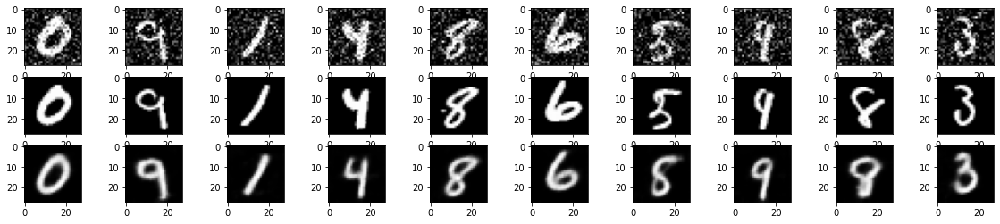

EPOCH 8/10
	 partial train loss (single batch): 0.027045
	 partial train loss (single batch): 0.025503
	 partial train loss (single batch): 0.025655
	 partial train loss (single batch): 0.027452
	 partial train loss (single batch): 0.029319
	 partial train loss (single batch): 0.025259
	 partial train loss (single batch): 0.030361
	 partial train loss (single batch): 0.029364
	 partial train loss (single batch): 0.024221
	 partial train loss (single batch): 0.025810
	 partial train loss (single batch): 0.026742
	 partial train loss (single batch): 0.022866
	 partial train loss (single batch): 0.028699
	 partial train loss (single batch): 0.025052
	 partial train loss (single batch): 0.026754
	 partial train loss (single batch): 0.030666
	 partial train loss (single batch): 0.022999
	 partial train loss (single batch): 0.025828
	 partial train loss (single batch): 0.022248
	 partial train loss (single batch): 0.025371
	 partial train loss (single batch): 0.027122
	 partial train loss (s

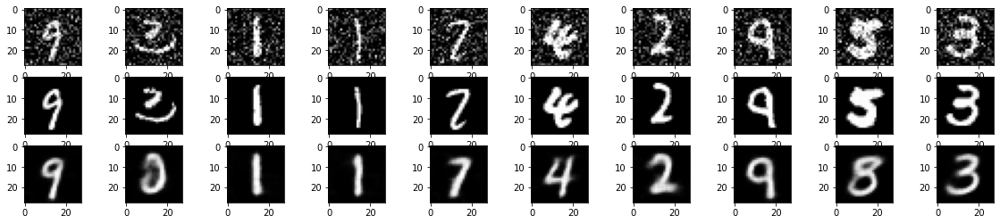

EPOCH 9/10
	 partial train loss (single batch): 0.028575
	 partial train loss (single batch): 0.022499
	 partial train loss (single batch): 0.029176
	 partial train loss (single batch): 0.029475
	 partial train loss (single batch): 0.028187
	 partial train loss (single batch): 0.030852
	 partial train loss (single batch): 0.025292
	 partial train loss (single batch): 0.024394
	 partial train loss (single batch): 0.027614
	 partial train loss (single batch): 0.028372
	 partial train loss (single batch): 0.026238
	 partial train loss (single batch): 0.026237
	 partial train loss (single batch): 0.023709
	 partial train loss (single batch): 0.025033
	 partial train loss (single batch): 0.025069
	 partial train loss (single batch): 0.022155
	 partial train loss (single batch): 0.028921
	 partial train loss (single batch): 0.025130
	 partial train loss (single batch): 0.023252
	 partial train loss (single batch): 0.027899
	 partial train loss (single batch): 0.026859
	 partial train loss (s

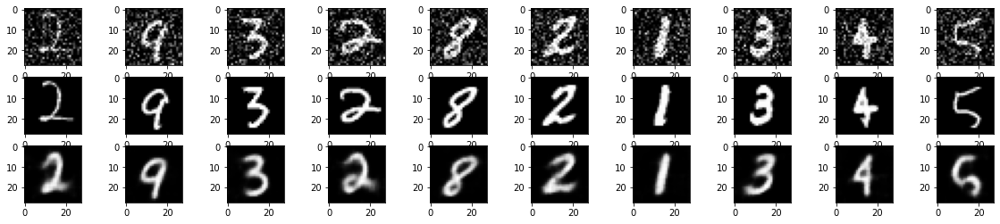

EPOCH 10/10
	 partial train loss (single batch): 0.023974
	 partial train loss (single batch): 0.025458
	 partial train loss (single batch): 0.028511
	 partial train loss (single batch): 0.025995
	 partial train loss (single batch): 0.027302
	 partial train loss (single batch): 0.026855
	 partial train loss (single batch): 0.025930
	 partial train loss (single batch): 0.026422
	 partial train loss (single batch): 0.029536
	 partial train loss (single batch): 0.028970
	 partial train loss (single batch): 0.026447
	 partial train loss (single batch): 0.025186
	 partial train loss (single batch): 0.022633
	 partial train loss (single batch): 0.023720
	 partial train loss (single batch): 0.024621
	 partial train loss (single batch): 0.027045
	 partial train loss (single batch): 0.027983
	 partial train loss (single batch): 0.025377
	 partial train loss (single batch): 0.027642
	 partial train loss (single batch): 0.027550
	 partial train loss (single batch): 0.023671
	 partial train loss (

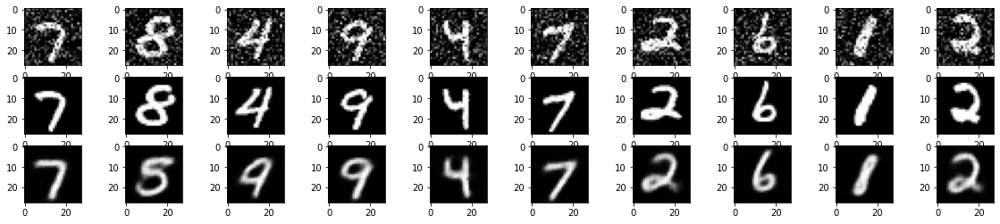

In [ ]:
#################  another way to show images
import matplotlib.pyplot as plt
import numpy as np
import random

def plot_ten_images(model, n = 10, noise_factor = 0.3):
 
  fig, ax = plt.subplots(3, 10, figsize=(20, 4))
  
  for i in range(10):
      idx = random.randint(0, len(test_dataset_noisy))
      ax[0][i].imshow(test_dataset_noisy[idx][0].squeeze(), cmap='gray')
      ax[1][i].imshow(test_dataset_noisy[idx][1].squeeze(), cmap='gray')
      ax[2][i].imshow(model(test_dataset_noisy[idx][0].unsqueeze(0).cuda()).cpu().detach().squeeze(), cmap='gray')
  plt.show()


noise_factor = 0.3
num_epochs = 10
history_da={'train_loss':[],'val_loss':[]}

for epoch in range(num_epochs):
    print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    ### Training (use the training function)
    train_loss=train_in_epoch(model, device, train_loader, loss_fn, optim, noise_factor)
    ### Validation  (use the testing function)
    val_loss = test_in_epoch(model, device, valid_loader, loss_fn, noise_factor)
    # Print Validationloss
    history_da['train_loss'].append(train_loss)
    history_da['val_loss'].append(val_loss)
    print('\n EPOCH {}/{} \t train loss {:.3f} \t val loss {:.3f}'.format(epoch + 1, num_epochs,train_loss,val_loss))
    plot_ten_images(model, noise_factor = noise_factor)


In [ ]:
pip install tqdm

In [ ]:
from tqdm import *

encoded_samples = []

for data in tqdm(test_dataset):
    image = data[0].unsqueeze(0).to(device)
    label = data[1]
    # Encode image
    model.eval()
    with torch.no_grad():
        encoded_image  = model.encoder(image)
    # Append to list
    encoded_image = encoded_image.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_image)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)
encoded_samples = pd.DataFrame(encoded_samples)

100%|██████████| 10000/10000 [00:10<00:00, 967.59it/s]


In [ ]:
encoded_samples

,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,label
0,-0.488459,1.762339,-0.974496,0.187032,7
1,-3.020689,0.497533,1.976188,1.900493,2
2,-1.110000,0.646340,0.517611,-0.327874,1
3,1.081670,-1.641698,1.140328,0.467869,0
4,-0.112927,-0.294662,0.096664,-1.389745,4
...,...,...,...,...,...
9995,-1.260085,0.318391,1.197757,2.742990,2
9996,0.540237,0.229829,0.511126,0.896176,3
9997,-0.859906,-0.172675,-0.057840,-1.046238,4
9998,-0.461490,-1.569656,-0.869053,0.670187,5


In [ ]:
import plotly.express as px

px.scatter(encoded_samples, x='Enc. Variable 0', y='Enc. Variable 1', 
           color=encoded_samples.label.astype(str), opacity=0.7)

In [ ]:
from sklearn.decomposition import PCA

 
pca = PCA(n_components = 2)
  
X_train = pca.fit_transform(encoded_samples.drop(['label'],axis=1))

fig = px.scatter(X_train, x=0, y=1,
                 color=encoded_samples.label.astype(str),
                 labels={'0': 'tsne-2d-one', '1': 'tsne-2d-two'})
fig.show()

In [ ]:

from sklearn.manifold import TSNE

tsne = TSNE(n_components=2)
tsne_results = tsne.fit_transform(encoded_samples.drop(['label'],axis=1))
fig = px.scatter(tsne_results, x=0, y=1,
                 color=encoded_samples.label.astype(str),
                 labels={'0': 'tsne-2d-one', '1': 'tsne-2d-two'})
fig.show()

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



Principal Component Analysis (PCA) of image latent feature vectors provides a compact representation of the images by capturing the most important features or patterns in the data. The latent feature vectors obtained through PCA can be used for various image processing tasks such as image compression, denoising, and dimensionality reduction. By using PCA, we can identify the most significant features that contribute to the variability in the data, and retain these features while discarding the rest. The conclusion from latent feature vectors obtained through PCA is that it provides a simplified and efficient representation of the original data that retains the most important information.

PCA (Principal Component Analysis) and t-SNE (t-Distributed Stochastic Neighbor Embedding) are two popular dimensionality reduction techniques used in data analysis and visualization.

PCA is a linear technique that is designed to identify the underlying structure of the data by finding the directions (principal components) that capture the most variance. The goal of PCA is to reduce the dimensionality of the data while preserving the maximum amount of variance. It is often used to reduce high-dimensional data to a lower-dimensional representation for visualization or further analysis.

On the other hand, t-SNE is a non-linear technique that is specifically designed for visualization. The goal of t-SNE is to map high-dimensional data to a 2D or 3D space in a way that preserves the local structure of the data. t-SNE works by minimizing the divergence between the probability distributions of the high-dimensional data and its lower-dimensional representation. This results in a mapping that groups similar data points close together, making it easier to visualize patterns and clusters in the data.

In summary, PCA is a linear technique that focuses on preserving the maximum variance in the data, while t-SNE is a non-linear technique designed for visualization that focuses on preserving the local structure of the data.